# Cleaning

We process the data available in the document *\data\raw\datos_raw_1951-2024.csv*

When everything is defined, we'll clean the 2025 data.

#### LIBRARIES

In [56]:
import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import os
import pandas as pd
import polars as pl
import sys

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

from scipy.interpolate import interp1d

print("### --- Version --- ###")
print("Python:", sys.version)
print("Pandas:", pd.__version__)
print("### ----------------- ###")


### --- Version --- ###
Python: 3.11.7 (tags/v3.11.7:fa7a6f2, Dec  4 2023, 19:24:49) [MSC v.1937 64 bit (AMD64)]
Pandas: 2.2.3
### ----------------- ###


#### CLASS AND FUNCTIONS

In [57]:
class Display:
    """
    Displays multiple pandas DataFrames as HTML tables side by side.

    Usage:
    ------
    To use this class, instantiate an object of the class and pass the pandas DataFrames 
    you want to display as arguments:

    Display('df1', 'df2', 'df3')
    """

    def __init__(self, **dfs):
        """
        Constructor of the class.

        Parameters:
        -----------
        *dfs : variable length argument list of pandas DataFrames
        """
        self.dfs = dfs
        
    def _repr_html_(self):
        """
        Magic method to display the DataFrames as HTML tables side by side.
        """
        html_tables = [
            f'<div style="float: left; padding: 10px;"><p><b>{name}</b></p>{df.to_pandas().to_html()}</div>'
            for name, df in self.dfs.items()
        ]
        return ''.join(html_tables)
    
    def __repr__(self):
        """
        Magic method to display the DataFrames as text.
        """
        return '\n\n'.join(f"{name}\n{df}" for name, df in self.dfs.items())

# ========================================================================================


def data_report(df):
    """
    Generates a report of descriptive statistics for a given pandas DataFrame.

    Parameters
    ----------
    df : pandas DataFrame
        The DataFrame for which to generate the report.

    Returns
    -------
    pandas DataFrame
        A transposed DataFrame containing columns for column name, data type, 
        missing values percentage, number of missing values, number of unique values, 
        and cardinality percentage.
    """

    return pd.DataFrame({
        "DATA_TYPE": df.dtypes,
        "MISSINGS (%)": df.isnull().mean() * 100,
        "MISSINGS": df.isnull().sum(),
        "UNIQUE_VALUES": df.nunique(),
        "CARDIN (%)": (df.nunique() * 100 / len(df))
    }).T


## CLEANING

#### LOADING DATA

We will load the dataframe with Polars for its speed.

In [58]:
df_raw = pl.read_csv('../data/raw/datos_raw_1951-2024.csv',separator=";", infer_schema_length=1000).to_pandas()
df_raw.tail()

,fecha,indicativo,nombre,provincia,altitud,tmed,prec,tmin,horatmin,tmax,...,horaPresMin,hrMedia,dir,velmedia,racha,horaracha,hrMax,horaHrMax,hrMin,horaHrMin
12501,2023-06-26,5783,SEVILLA AEROPUERTO,SEVILLA,34,"32,5","0,0","23,0",05:00,"42,0",...,17,27.0,99,"3,6","10,3",Varias,56,Varias,15,15:58
12502,2023-06-27,5783,SEVILLA AEROPUERTO,SEVILLA,34,"31,4","0,0","22,6",04:44,"40,2",...,17,27.0,27,"3,3","8,3",Varias,60,Varias,13,16:38
12503,2023-06-28,5783,SEVILLA AEROPUERTO,SEVILLA,34,"29,9","0,0","21,5",05:00,"38,3",...,16,31.0,99,"3,3","9,7",Varias,56,05:00,17,14:11
12504,2023-06-29,5783,SEVILLA AEROPUERTO,SEVILLA,34,"29,1","0,0","22,4",05:30,"35,8",...,17,56.0,22,"6,4","12,5",Varias,96,05:55,34,16:31
12505,2023-06-30,5783,SEVILLA AEROPUERTO,SEVILLA,34,"26,4","0,0","18,7",05:16,"34,1",...,17,41.0,25,"3,6","9,7",17:37,79,Varias,27,14:37


In [59]:
# DROP THE UNNECESSARY COLUMNS

# LOCATION DATA
df_raw.drop(['indicativo', 'nombre', 'provincia', 'altitud'], axis=1, inplace=True)

# TIME DATA -> TIME DATA ARE NOT VALID BECAUSE IN SOME CASES THEY APPEAR AS “MISCELLANEOUS”. ALSO, THERE IS NO VALUE TO BE GAINED FROM SUCH FINE-TUNING
df_raw.drop(['horatmin', 'horatmax', 'horaracha', 'horaPresMax', 'horaPresMin', 'horaHrMax', 'horaHrMax', 'horaHrMin'], axis=1, inplace=True)

df_raw.tail()

,fecha,tmed,prec,tmin,tmax,sol,presMax,presMin,hrMedia,dir,velmedia,racha,hrMax,hrMin
12501,2023-06-26,"32,5","0,0","23,0","42,0","13,3","1013,3","1009,2",27.0,99,"3,6","10,3",56,15
12502,2023-06-27,"31,4","0,0","22,6","40,2","13,1","1012,0","1006,5",27.0,27,"3,3","8,3",60,13
12503,2023-06-28,"29,9","0,0","21,5","38,3","9,7","1011,0","1007,5",31.0,99,"3,3","9,7",56,17
12504,2023-06-29,"29,1","0,0","22,4","35,8","10,6","1012,9","1008,2",56.0,22,"6,4","12,5",96,34
12505,2023-06-30,"26,4","0,0","18,7","34,1","13,3","1012,5","1009,2",41.0,25,"3,6","9,7",79,27


First sight report:

In [60]:
data_report(df_raw)

,fecha,tmed,prec,tmin,tmax,sol,presMax,presMin,hrMedia,dir,velmedia,racha,hrMax,hrMin
DATA_TYPE,object,object,object,object,object,object,object,object,float64,object,object,object,object,object
MISSINGS (%),0.0,0.335839,0.0,0.31185,0.279866,1.079482,6.276987,6.276987,0.4158,16.064289,13.633456,16.096274,83.447945,83.447945
MISSINGS,0,42,0,39,35,135,785,785,52,2009,1705,2013,10436,10436
UNIQUE_VALUES,12506,304,353,284,352,145,377,416,85,38,53,112,54,87
CARDIN (%),100.0,2.430833,2.822645,2.27091,2.814649,1.159443,3.014553,3.326403,0.679674,0.303854,0.423797,0.89557,0.431793,0.695666


**Conclusiones 1:**
- With the objective we are looking for (to know if we will enjoy a pleasant Easter), we mainly need temperature and precipitation. They will also come in handy to classify and anticipate wind and humidity, but we do not have complete data for these two areas.

    - Wind direction data since 1960
    - Relative humidity data since 2009
 
- We will clean up the fields and decide later if it adds quality to the analysis.

--- 

- Con el objetivo que estamos buscando (saber si disfrutaremos de una Semana Santa agradable), principalmente necesitamos temperatura y precipitaciones. También nos vendrán bien para clasificar y anticipar el viento y la humedad, pero no tenemos datos completos de estas dos áreas.

    - Datos de dirección del viento desde 1960
    - Datos de humedad relativa desde 2009
 
- Limpiaremos los campos y decidiremos más adelante si aporta calidad al análisis.



Correct column types: 
- We make the date the index.
- Everything else will be float64


PARSEAR CON METADATOS QUE PARA ESO ESTÁN!

In [61]:
# REPLACE COMMAS
df_raw = df_raw.applymap(lambda x: x.replace(',', '.') if isinstance(x, str) else x)

# DATE TO INDEX
df_raw['fecha'] = pd.to_datetime(df_raw['fecha'])
df_raw.set_index('fecha', inplace=True)

# REPLACE TEXT FOR NaN IN "PREC"
df_raw['prec'] = df_raw['prec'].replace('Ip', '0.05')

# PARSE ALL VALUES AS FLOAT EXCEPT DIR
df_raw = df_raw.astype(float)
df_raw['dir'] = df_raw['dir'].fillna(-1).astype(float).astype(int)
df_raw.tail()

,tmed,prec,tmin,tmax,sol,presMax,presMin,hrMedia,dir,velmedia,racha,hrMax,hrMin
fecha,,,,,,,,,,,,,
2023-06-26,32.5,0.0,23.0,42.0,13.3,1013.3,1009.2,27.0,99,3.6,10.3,56.0,15.0
2023-06-27,31.4,0.0,22.6,40.2,13.1,1012.0,1006.5,27.0,27,3.3,8.3,60.0,13.0
2023-06-28,29.9,0.0,21.5,38.3,9.7,1011.0,1007.5,31.0,99,3.3,9.7,56.0,17.0
2023-06-29,29.1,0.0,22.4,35.8,10.6,1012.9,1008.2,56.0,22,6.4,12.5,96.0,34.0
2023-06-30,26.4,0.0,18.7,34.1,13.3,1012.5,1009.2,41.0,25,3.6,9.7,79.0,27.0


#### OUTLIERS & MISSINGS

In [62]:
df_raw.describe()

,tmed,prec,tmin,tmax,sol,presMax,presMin,hrMedia,dir,velmedia,racha,hrMax,hrMin
count,12464.000000,12506.000000,12467.000000,12471.000000,12371.000000,11721.000000,11721.000000,12454.000000,12506.000000,10801.000000,10493.000000,2070.000000,2070.000000
mean,16.575891,1.554002,10.377220,22.769698,8.091545,1016.467562,1012.153383,62.386141,19.748681,3.302963,10.613723,87.744928,36.801932
std,5.559975,5.230300,5.062639,6.651790,3.872113,5.816443,6.372070,16.107998,22.443209,2.010250,4.134883,10.843126,17.816865
min,0.900000,0.000000,-5.500000,4.000000,0.000000,990.100000,976.300000,16.000000,-1.000000,0.000000,0.000000,45.000000,5.000000
25%,12.400000,0.000000,6.800000,17.600000,5.500000,1012.700000,1008.500000,51.000000,5.000000,1.900000,7.800000,82.000000,23.000000
50%,15.800000,0.000000,10.300000,21.600000,9.000000,1015.800000,1011.700000,62.000000,22.000000,3.100000,10.300000,91.000000,34.000000
75%,20.500000,0.050000,14.000000,27.400000,11.000000,1020.100000,1016.000000,74.000000,24.000000,4.400000,12.800000,96.000000,48.000000
max,33.800000,74.700000,26.600000,45.200000,14.400000,1038.000000,1035.400000,100.000000,99.000000,14.700000,37.500000,100.000000,100.000000


In [ ]:
df_raw.describe().loc[['min', 'max'], :].T

,min,max
prec,0.0,109.3
tmin,-4.4,29.3
tmax,4.0,46.6
dir,-1.0,99.0
velmedia,0.0,12.8
racha,0.0,31.9
sol,0.0,14.4
presMax,986.8,1038.0
presMin,976.3,1035.4



We need to check the 'dir' field as it contain values that are outside the normal range (between 1 and 36), as well as the 'racha', 'sol', and 'velmedia' values, as they cannot be zero.

Our first step is make them NaN.

In [ ]:
df_raw['dir'] = np.where((df_raw['dir'] < 1) | (df_raw['dir'] > 36), np.nan, df_raw['dir'])
df_raw.loc[df_raw['racha'] == 0, 'racha'] = np.nan
df_raw.loc[df_raw['sol'] == 0, 'sol'] = np.nan
df_raw.loc[df_raw['velmedia'] == 0, 'velmedia'] = np.nan

In [ ]:
data_report(df_raw)

COL_N,prec,tmin,tmax,dir,velmedia,racha,sol,presMax,presMin
DATA_TYPE,float64,float64,float64,float64,float64,float64,float64,float64,float64
MISSINGS (%),3.59,0.18,0.16,11.5,1.45,1.65,4.31,0.55,0.55
MISSINGS,568,28,26,1822,230,262,683,87,87
UNIQUE_VALUES,378,298,370,36,44,91,144,384,424
CARDIN (%),2.39,1.88,2.34,0.23,0.28,0.57,0.91,2.42,2.68


<Axes: >

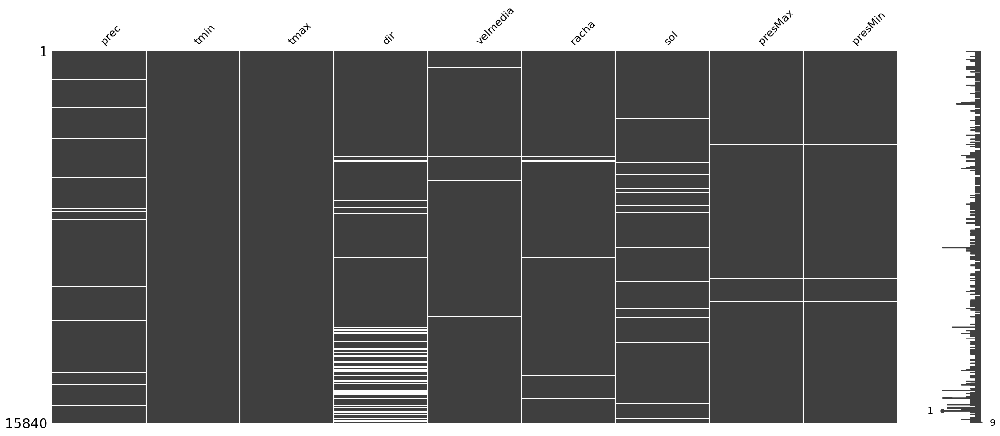

In [67]:
msno.matrix(df_raw)

The highest percentage of missings is 11.50%. Let's see case by case how to process missings.

We will segment the DF by related columns and then concatenate.

--- 

### STEP BY STEP:

- Evaluate if the missing values are consecutive or scattered:
    - If they are consecutive, we will try to solve it using forecasting.
    - If they are scattered, we will use a moving average or interpolation, depending on how many there are.


---

#### **Temperature values**

In [68]:
df_temp = df_raw[['tmin', 'tmax']]

nan_tmin = df_temp[['tmin']][df_temp['tmin'].isnull()].head(5)
nan_tmax = df_temp[['tmax']][df_temp['tmax'].isnull()].head(5)

Display('nan_tmin', 'nan_tmax')

,tmin
fecha,
1997-11-02,NaN
2002-12-03,NaN
2002-12-04,NaN
2002-12-05,NaN
2002-12-06,NaN
,tmax
fecha,
1997-11-02,NaN
2002-12-03,NaN


The days without values are the same in both columns. We do not want to drop them, but to assign a value. Let's see what we can do.

In [69]:
nan_by_year_min = df_temp['tmin'].isna().groupby(df_temp.index.year).sum().astype(int)
min = pd.DataFrame(nan_by_year_min[nan_by_year_min > 0])
nan_by_year_max = df_temp['tmax'].isna().groupby(df_temp.index.year).sum().astype(int)
max = pd.DataFrame(nan_by_year_max[nan_by_year_max > 0])

Display('min', 'max')

,tmin
fecha,
1997,1
2002,4
2012,2
2014,1
2017,2
2019,2
2020,8
2021,7
2022,1


First we will pass a moving average with some soft values to solve the scattered values, and then we will see how to deal with the 8-day gap remaining in 2020.

In [70]:
df_temp_ma = df_temp.fillna(df_temp.rolling(3, center=True, min_periods=1).mean()).round(2)

report_raw_data = data_report(df_temp)
report_mov_ave = data_report(df_temp_ma)
Display('report_raw_data', 'report_mov_ave')

COL_N,tmin,tmax
DATA_TYPE,float64,float64
MISSINGS (%),0.18,0.16
MISSINGS,28,26
UNIQUE_VALUES,298,370
CARDIN (%),1.88,2.34
COL_N,tmin,tmax
DATA_TYPE,float64,float64
MISSINGS (%),0.05,0.05
MISSINGS,8,8
UNIQUE_VALUES,303,375


Now we calculate the missing values in the DataFrame using a second-order polynomial interpolation method to fill the gap.

In [71]:
df_temp_ip =  df_temp.interpolate(method='polynomial', order=2).round(2)

Now let's compare the original, with the result of the interpolation.

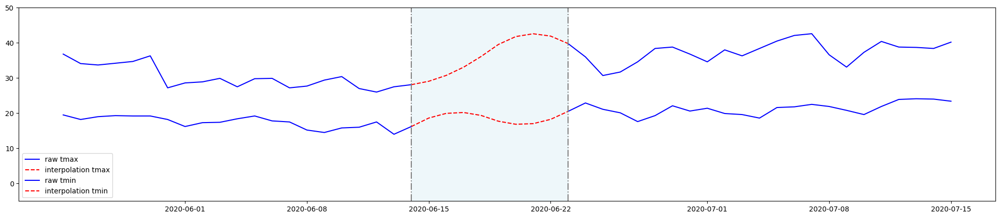

In [72]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_temp, df_temp_ip], axis=1, keys=['raw', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='2020-05-25', end='2020-07-15')
nan_date_range = pd.date_range(start='2020-06-14', end='2020-06-23')
# tmin  -4.4	29.3
# tmax  4.0     46.6
y_limits = [-5, 50]

# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['raw']['tmax'], color='blue', label='raw tmax')
plt.plot(df_plot.loc[nan_date_range]['interpolation']['tmax'], color='red', linestyle='dashed', label='interpolation tmax')


plt.plot(df_plot.loc[full_date_range]['raw']['tmin'], color='blue', label='raw tmin')
plt.plot(df_plot.loc[nan_date_range]['interpolation']['tmin'], color='red', linestyle='dashed', label='interpolation tmin')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()


Compose the final dataframe.

In [73]:
df_temp = df_temp_ma.copy()
df_temp = df_temp_ip.combine_first(df_temp)

In [74]:
data_report(df_temp)

COL_N,tmin,tmax
DATA_TYPE,float64,float64
MISSINGS (%),0.0,0.0
MISSINGS,0,0
UNIQUE_VALUES,323,392
CARDIN (%),2.04,2.47


---
We will use the same procedure for all sections.

- Pressure values

In [75]:
df_presion = df_raw[['presMin', 'presMax']]

nan_presmin = df_presion[['presMin']][df_presion['presMin'].isnull()].head(5)
nan_presmax = df_presion[['presMax']][df_presion['presMax'].isnull()].head(5)

Display('nan_presmin', 'nan_presmax')

,presMin
fecha,
1990-11-21,NaN
1990-11-22,NaN
1990-11-24,NaN
1990-11-25,NaN
1990-11-26,NaN
,presMax
fecha,
1990-11-21,NaN
1990-11-22,NaN


In [76]:
df_presion_ma = df_presion.fillna(df_presion.rolling(3, center=True, min_periods=1).mean()).round(2)

report_raw_data = data_report(df_presion)
report_mov_ave = data_report(df_presion_ma)
Display('report_raw_data', 'report_mov_ave')

COL_N,presMin,presMax
DATA_TYPE,float64,float64
MISSINGS (%),0.55,0.55
MISSINGS,87,87
UNIQUE_VALUES,424,384
CARDIN (%),2.68,2.42
COL_N,presMin,presMax
DATA_TYPE,float64,float64
MISSINGS (%),0.16,0.16
MISSINGS,25,25
UNIQUE_VALUES,443,409


In [77]:
nan_by_year_min = df_presion_ma['presMin'].isna().groupby(df_presion_ma.index.year).sum().astype(int)
min = pd.DataFrame(nan_by_year_min[nan_by_year_min > 0])
nan_by_year_max = df_presion_ma['presMax'].isna().groupby(df_presion_ma.index.year).sum().astype(int)
max = pd.DataFrame(nan_by_year_max[nan_by_year_max > 0])

Display('min', 'max')

,presMin
fecha,
1990,2
2002,2
2020,21
,presMax
fecha,
1990,2
2002,2
2020,21


With the 3-days window for the moving average, we still got a noticeable gap of 19 days at Summer 2020.

2020-06-16 to 2020-07-06

In [78]:
df_presion_ip =  df_presion.interpolate(method='polynomial', order=2).round(2)

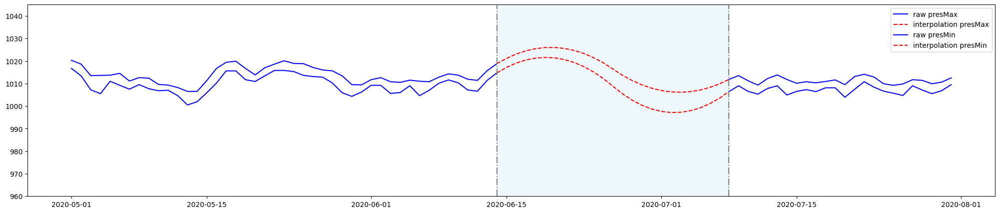

In [79]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_presion, df_presion_ip], axis=1, keys=['raw', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='2020-05-01', end='2020-07-31')
nan_date_range = pd.date_range(start='2020-06-14', end='2020-07-08')
# presMax	986.8	1038.0
# presMin	976.3	1035.4
y_limits = [960, 1045]


# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['raw']['presMax'], color='blue', label='raw presMax')
plt.plot(df_plot.loc[nan_date_range]['interpolation']['presMax'], color='red', linestyle='dashed', label='interpolation presMax')


plt.plot(df_plot.loc[full_date_range]['raw']['presMin'], color='blue', label='raw presMin')
plt.plot(df_plot.loc[nan_date_range]['interpolation']['presMin'], color='red', linestyle='dashed', label='interpolation presMin')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()



Compose the final dataframe.

In [80]:
df_presion = df_presion_ma.copy()
df_presion = df_presion_ip.combine_first(df_presion)

In [81]:
data_report(df_presion)

COL_N,presMin,presMax
DATA_TYPE,float64,float64
MISSINGS (%),0.0,0.0
MISSINGS,0,0
UNIQUE_VALUES,499,459
CARDIN (%),3.15,2.9


---

- Wind values

This will be studied by individual columns. *Note: When we parsed the values an integer, we changed all the outliers for NaNs.*

In [82]:
df_viento = df_raw[['dir', 'velmedia', 'racha']]

In [83]:
df_viento.describe().loc[['min', 'max'], :].T

,min,max
dir,1.0,36.0
velmedia,0.3,12.8
racha,1.1,31.9


In [84]:
df_1 = df_viento.loc['1985-10-27':'1985-11-02']
df_2 = df_viento.loc['1986-01-02':'1986-01-08']
df_3 = df_viento.loc['1981-11-04':'1981-11-10']
Display('df_1', 'df_2', 'df_3')

,dir,velmedia,racha
fecha,,,
1985-10-27,5.0,3.1,9.7
1985-10-28,5.0,2.8,10.3
1985-10-29,14.0,0.8,9.2
1985-10-30,NaN,1.4,5.6
1985-10-31,32.0,2.2,7.8
1985-11-01,23.0,1.4,6.9
1985-11-02,14.0,3.1,15.3
,dir,velmedia,racha
fecha,,,


Now we'll find if there are any large gaps or ther are scattered values.

In [85]:
nan_by_year_dir = df_viento['dir'].isna().groupby(df_viento.index.year).sum().astype(int)
dir = pd.DataFrame(nan_by_year_dir[nan_by_year_dir > 0])
nan_by_year_velmedia = df_viento['velmedia'].isna().groupby(df_viento.index.year).sum().astype(int)
velmedia = pd.DataFrame(nan_by_year_velmedia[nan_by_year_velmedia > 0])
nan_by_year_racha = df_viento['racha'].isna().groupby(df_viento.index.year).sum().astype(int)
racha = pd.DataFrame(nan_by_year_racha[nan_by_year_racha > 0])


Display('dir', 'velmedia', 'racha')

,dir
fecha,
1980,1
1981,3
1982,6
1983,2
1985,1
1986,32
1988,6
1989,3
1990,4


In [86]:
# CLEANING OF SCATTERED VALUES
df_viento_ma = df_viento.fillna(df_viento.rolling(3, center=True, min_periods=1).mean()).round(2)

report_raw_data = data_report(df_viento)
report_mov_ave = data_report(df_viento_ma)
Display('report_raw_data', 'report_mov_ave')

COL_N,dir,velmedia,racha
DATA_TYPE,float64,float64,float64
MISSINGS (%),11.5,1.45,1.65
MISSINGS,1822,230,262
UNIQUE_VALUES,36,44,91
CARDIN (%),0.23,0.28,0.57
COL_N,dir,velmedia,racha
DATA_TYPE,float64,float64,float64
MISSINGS (%),1.82,0.18,0.5
MISSINGS,288,28,79
UNIQUE_VALUES,68,85,130


In [87]:
nan_by_year_dir = df_viento_ma['dir'].isna().groupby(df_viento_ma.index.year).sum().astype(int)
dir = pd.DataFrame(nan_by_year_dir[nan_by_year_dir > 0])
nan_by_year_velmedia = df_viento_ma['velmedia'].isna().groupby(df_viento_ma.index.year).sum().astype(int)
velmedia = pd.DataFrame(nan_by_year_velmedia[nan_by_year_velmedia > 0])
nan_by_year_racha = df_viento_ma['racha'].isna().groupby(df_viento_ma.index.year).sum().astype(int)
racha = pd.DataFrame(nan_by_year_racha[nan_by_year_racha > 0])


Display('dir', 'velmedia', 'racha')

,dir
fecha,
1986,4
1988,4
1990,1
1991,5
1992,33
1997,5
1998,12
2002,4
2003,2


- **dir**

We'll take the largest gap: 2020-06-15 / 2020-07-26



In [88]:
df_dir_ip =  df_viento_ma['dir'].interpolate(method='polynomial', order=3).round()

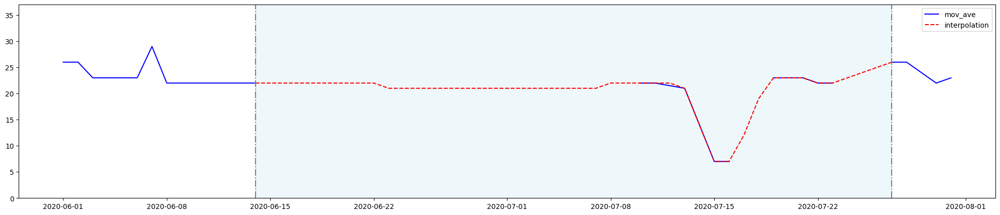

In [89]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_viento_ma[['dir']], df_dir_ip], axis=1, keys=['mov_ave', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='2020-06-01', end='2020-07-31')
nan_date_range = pd.date_range(start='2020-06-14', end='2020-07-27')
y_limits = [0, 37]


# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['mov_ave'], color='blue', label='mov_ave')
plt.plot(df_plot.loc[nan_date_range]['interpolation'], color='red', linestyle='dashed', label='interpolation')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()

In [90]:
df_viento['dir'] = df_viento_ma['dir'].copy()
df_viento['dir'] = df_dir_ip.combine_first(df_viento_ma['dir'])

### PENDIENTE DE RESOLVER ESTE NAN

- **velmedia**

The largest gap is between 2020-06-16 and 2020-07-08.

In [91]:
df_velmedia_ip =  df_viento_ma['velmedia'].interpolate(method='polynomial', order=3).round()

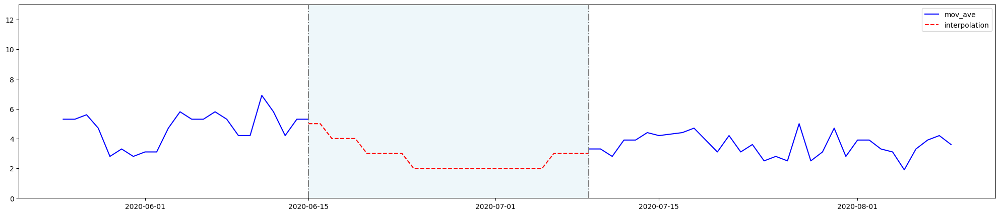

In [92]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_viento_ma[['velmedia']], df_velmedia_ip], axis=1, keys=['mov_ave', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='2020-05-25', end='2020-08-09')
nan_date_range = pd.date_range(start='2020-06-15', end='2020-07-09')
y_limits = [0, 13]


# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['mov_ave'], color='blue', label='mov_ave')
plt.plot(df_plot.loc[nan_date_range]['interpolation'], color='red', linestyle='dashed', label='interpolation')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()

In [93]:
df_viento['velmedia'] = df_viento_ma['velmedia'].copy()
df_viento['velmedia'] = df_velmedia_ip.combine_first(df_viento_ma['velmedia'])

- **racha**

The largest gap is between 1992-10-22 and 1992-11-15.

In [94]:
df_racha_ip =  df_viento_ma['racha'].interpolate(method='polynomial', order=2).round()

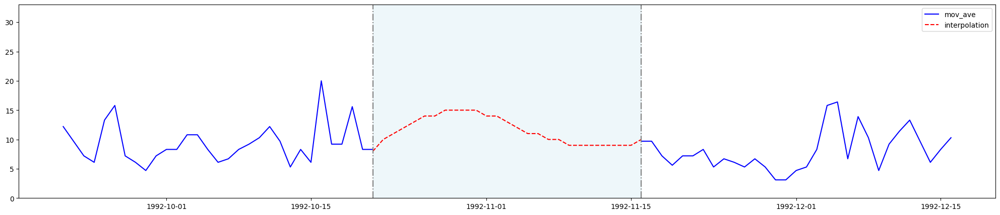

In [95]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_viento_ma[['racha']], df_racha_ip], axis=1, keys=['mov_ave', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='1992-09-21', end='1992-12-16')
nan_date_range = pd.date_range(start='1992-10-21', end='1992-11-16')
y_limits = [0, 33]


# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['mov_ave'], color='blue', label='mov_ave')
plt.plot(df_plot.loc[nan_date_range]['interpolation'], color='red', linestyle='dashed', label='interpolation')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()

In [96]:
df_viento['racha'] = df_viento_ma['racha'].copy()
df_viento['racha'] = df_racha_ip.combine_first(df_viento_ma['racha'])

In [97]:
data_report(df_viento)

COL_N,dir,velmedia,racha
DATA_TYPE,float64,float64,float64
MISSINGS (%),0.01,0.0,0.0
MISSINGS,1,0,0
UNIQUE_VALUES,36,14,31
CARDIN (%),0.23,0.09,0.2


---

- Sun values

In [98]:
df_sol = df_raw[['sol']]
df_sol.describe().loc[['min', 'max'], :].T

,min,max
sol,0.1,14.4


Now we'll find if there are any large gaps or ther are scattered values.

In [99]:
# CLEANING OF SCATTERED VALUES
df_sol_ma = df_sol.fillna(df_sol.rolling(3, center=True, min_periods=1).mean()).round(2)

report_raw_data = data_report(df_sol)
report_mov_ave = data_report(df_sol_ma)
Display('report_raw_data', 'report_mov_ave')

COL_N,sol
DATA_TYPE,float64
MISSINGS (%),4.31
MISSINGS,683
UNIQUE_VALUES,144
CARDIN (%),0.91
COL_N,sol
DATA_TYPE,float64
MISSINGS (%),0.55
MISSINGS,87
UNIQUE_VALUES,240


In [100]:
nan_by_year_sol = df_sol_ma['sol'].isna().groupby(df_sol_ma.index.year).sum().astype(int)
sol = pd.DataFrame(nan_by_year_sol[nan_by_year_sol > 0])
sol

,sol
fecha,
1985,1
1986,7
1987,4
1991,2
1992,3
1996,27
1997,9
2000,3
2001,1


Let's use the gap between 2020-06-17 and 2020-07-06

In [101]:
df_sol_ip =  df_sol_ma['sol'].interpolate(method='polynomial', order=2).round()

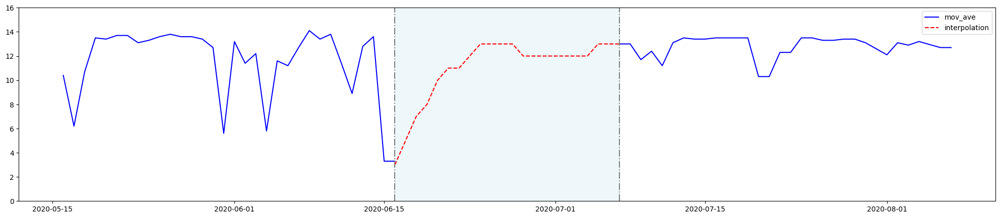

In [102]:
# COMPOSE THE DATAFRAME
df_plot = pd.concat([df_sol_ma[['sol']], df_sol_ip], axis=1, keys=['mov_ave', 'interpolation'])

plt.figure(figsize=(25,5))

# DECLARE THE RANGES
full_date_range = pd.date_range(start='2020-05-16', end='2020-08-07')
nan_date_range = pd.date_range(start='2020-06-16', end='2020-07-07')
y_limits = [0, 16]


# PLOT THE VALUES
plt.plot(df_plot.loc[full_date_range]['mov_ave'], color='blue', label='mov_ave')
plt.plot(df_plot.loc[nan_date_range]['interpolation'], color='red', linestyle='dashed', label='interpolation')

# DELIMIT THE GAP
plt.axvline(nan_date_range[0], color='gray', linestyle='dashdot')
plt.axvline(nan_date_range[-1], color='gray', linestyle='dashdot')
plt.fill_betweenx(y=y_limits, x1=nan_date_range[0], x2=nan_date_range[-1], color='lightblue', alpha=0.2)

plt.ylim(y_limits)
plt.legend()
plt.show()

In [103]:
df_sol['sol'] = df_sol_ma['sol'].copy()
df_sol['sol'] = df_sol_ip.combine_first(df_sol_ma['sol'])

In [104]:
data_report(df_sol)

COL_N,sol
DATA_TYPE,float64
MISSINGS (%),0.0
MISSINGS,0
UNIQUE_VALUES,15
CARDIN (%),0.09


---

- Rain values

In [105]:
df_lluvia = df_raw[['prec']]
df_lluvia.describe().loc[['min', 'max'], :].T

,min,max
prec,0.0,109.3


In [113]:
df_imputer = pd.concat([df_temp, df_presion, df_viento, df_sol, df_lluvia], axis=1, sort=False)
data_report(df_imputer)

COL_N,tmin,tmax,presMin,presMax,dir,velmedia,racha,sol,prec
DATA_TYPE,float64,float64,float64,float64,float64,float64,float64,float64,float64
MISSINGS (%),0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,3.59
MISSINGS,0,0,0,0,1,0,0,0,568
UNIQUE_VALUES,323,392,499,459,36,14,31,15,378
CARDIN (%),2.04,2.47,3.15,2.9,0.23,0.09,0.2,0.09,2.39


To deal with the null values of the rainfall, we're going to use the iterative imputation method of the sklearn.impute library. This method consists in estimating the missing values from a model that fits with the other columns of the dataset. In this way, we take advantage of all the available information and avoid introducing biases or noise in the data.

Usaremos un gridsearch

In [118]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Crear una instancia de IterativeImputer
imputer = IterativeImputer(random_state=0)

# Definir los parámetros para la búsqueda en cuadrícula
param_grid = {
    "estimator": [None, KNeighborsRegressor(), LinearRegression(), DecisionTreeRegressor()],
    "initial_strategy": ["mean", "median", "most_frequent", "constant"],
    "max_iter": [5, 10, 15, 20],
    "tol": [0.01, 0.001],
    "n_nearest_features": [None, 3, 5, 7, 10, 12, 15],
    "sample_posterior": [False, True]
}

# Crear una instancia de GridSearchCV con el imputador y el espacio de búsqueda
grid = GridSearchCV(imputer, param_grid, scoring='neg_mean_squared_error', cv=5, verbose=2)

# Ajustar el GridSearchCV a los datos de entrenamiento
grid.fit(X_train, y_train)

# Obtener el mejor estimador (imputador) y los mejores parámetros
best_imputer = grid.best_estimator_
best_params = grid.best_params_

# Imputar los valores faltantes en los datos de prueba usando el mejor estimador
X_test_imputed = best_imputer.transform(X_test)

# Calcular la puntuación de MSE en los datos imputados
mse = mean_squared_error(y_test, X_test_imputed[:, -1])

# Imprimir la mejor configuración de parámetros y la puntuación de MSE
print("Mejores parámetros:", best_params)
print("Puntuación de MSE:", mse)


Fitting 5 folds for each of 1792 candidates, totalling 8960 fits
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=me

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=me

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=me

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean,

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total t

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.0

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; tot

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimat

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimat

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=None, initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   3.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.8s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   1.4s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.3s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.5s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   2.2s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   3.0s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   3.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=KNeighborsRegressor(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.9s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_neares

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_pos

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, samp

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sam

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, s

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sam

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sam

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, 

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sam

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sam

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_n

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_featu

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_fe

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_neares

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nea

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_neares

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_f

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_near

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nea

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nea

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_neares

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_f

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_f

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_near

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nea

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nea

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=median, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), ini

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_st

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strat

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initi

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegres

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), init

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), init

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), in

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegre

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), init

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), in

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=most_frequent, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=cons

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_ne

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_ne

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5,

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_ite

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.1s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=cons

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_ite

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=1

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.2s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=cons

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_ite

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=2

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=2

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_i

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   0.4s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_

c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   0.3s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s
[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=LinearRegression(), initial_strategy=constant, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   7.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   7.0s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   7.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   7.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   9.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   9.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   9.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.7s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s
[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   8.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   8.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   8.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=mean, max_iter=20, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   1.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   1.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=5, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   2.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   2.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   3.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   3.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   4.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=10, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   3.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   5.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   4.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   5.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=10, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=12, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.01; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=15, n_nearest_features=15, sample_posterior=True, tol=0.001; total time=   6.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   8.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   9.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   9.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=None, sample_posterior=True, tol=0.001; total time=   9.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.01; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=False, tol=0.001; total time=   0.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.01; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.5s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=3, sample_posterior=True, tol=0.001; total time=   4.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.01; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   7.1s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   7.0s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.01; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=5, sample_posterior=True, tol=0.001; total time=   6.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.01; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.3s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=False, tol=0.001; total time=   0.4s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.6s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.8s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.9s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   9.2s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.01; total time=   8.7s


c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:776: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 219, in __call__
    return self._score(
           ^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 261, in _score
    y_pred = method_caller(estimator, "predict", X)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\jdelacu1\AppData\Local\Programs\Python\Python311\L

[CV] END estimator=DecisionTreeRegressor(), initial_strategy=median, max_iter=20, n_nearest_features=7, sample_posterior=True, tol=0.001; total time=   8.6s


KeyboardInterrupt: 

---

#### ENSEMBLE OF THE FINAL DATASET


In [ ]:
outname = 'data_clean_1980_2023.csv'
folder = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', 'clean'))

# VALIDO QUE LA CARPETA EXISTA
if not os.path.exists(folder):
    # CREO LA CARPETA SI NO EXISTE
    os.makedirs(folder)
    print(f"Carpeta {folder} creada correctamente")

# GUARDO EL ARCHIVO DE SALIDA
outpath = os.path.join(folder, outname)
df_clean.to_csv(outpath, sep=';')
print(outpath)
print(f"La base de datos se ha extraido correctamente.")